# _Supervised Learning_
- Pijar Hatinurani Merdeka

## _Import Library_

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
import plotly.express as px
import glob
from scipy import stats

print('numpy version : ',np.__version__)
print('pandas version : ',pd.__version__)
print('seaborn version : ',sns.__version__)

numpy version :  1.26.4
pandas version :  2.2.0
seaborn version :  0.13.2


In [ ]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 12, 4
rcParams['lines.linewidth'] = 3
rcParams['xtick.labelsize'] = 'large'
rcParams['ytick.labelsize'] = 'large'

## _Import Dataset_

In [ ]:
import gdown
url = 'https://drive.google.com/file/d/1udQirplaI0mAGJnuZPlPHPaxr7RtisYt/view'
output = 'youtube_statistics.xlsx'

gdown.download(url, output)

Downloading...
From: https://drive.google.com/file/d/1udQirplaI0mAGJnuZPlPHPaxr7RtisYt/view
To: /content/youtube_statistics.xlsx
83.3kB [00:00, 23.9MB/s]


'youtube_statistics.xlsx'

In [ ]:
df = pd.read_excel('youtube_statistics.xlsx')
df.head()

,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,No_tags,desc_len,len_title,publish_date
0,2017-11-14,Sharry Mann: Cute Munda ( Song Teaser) | Parmi...,Lokdhun Punjabi,1,12:20:39,"sharry mann|""sharry mann new song""|""sharry man...",1096327,33966,798,882,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...,15,920,81,2017-11-12
1,2017-11-14,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",HJ NEWS,25,05:43:56,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर द...",590101,735,904,0,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",19,2232,58,2017-11-13
2,2017-11-14,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,TFPC,24,15:48:08,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,473988,2011,243,149,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...,14,482,58,2017-11-12
3,2017-11-14,Eruma Saani | Tamil vs English,Eruma Saani,23,07:08:48,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Mov...",1242680,70353,1624,2684,False,False,False,This video showcases the difference between pe...,20,263,30,2017-11-12
4,2017-11-14,why Samantha became EMOTIONAL @ Samantha naga ...,Filmylooks,24,01:14:16,"Filmylooks|""latest news""|""telugu movies""|""telu...",464015,492,293,66,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...,11,753,88,2017-11-13


## Pendahuluan

_Dataset_ ini bernama **YouTube Views Prediction**. Salah satu implementasi regresi yang dapat dilakukan adalah dengan melakukan prediksi _views_ pada video YouTube dengan menggunakan angka statistik atau atribut lain pada videonya. <br>
Data statistik tersebut terdapat pada _file_ `youtube_statistics.xlsx` dengan keterangan sebagai berikut.
- `trending_date`: tanggal ketika video trending
- `title`: judul video
- `channel_title`: nama channel
- `category_id`: kategori video dalam label encoding
- `publish_time`: waktu publish video
- `tags`: tag yang digunakan pada video
- `views`: jumlah views video
- `likes`: jumlah likes video
- `dislikes`: jumlah dislikes video
- `comment_count`: jumlah komentar pada video
- `comments_disabled`: apakah status komentar dinonaktifkan pada video
- `ratings_disabled`: apakah rating dinonaktifkan pada video
- `video_error_or_removed`: apakah video error atau sudah dihapus saat ini
- `description`: deskripsi video
- `No_tags`: jumlah tags yang digunakan
- `desc_len`: panjang kata deskripsi video
- `len_title`: panjang kata judul video
- `publish_date`: tanggal publish video

## 1. **_Exploratory Data Analysyis_**

Lakukan EDA dan preprocessing sederhana, jelaskan fitur mana yang sebaiknya digunakan dari hasil EDA?

### a. _Descriptive Statistics_

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36791 entries, 0 to 36790
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   trending_date           36791 non-null  object        
 1   title                   36791 non-null  object        
 2   channel_title           36791 non-null  object        
 3   category_id             36791 non-null  int64         
 4   publish_time            36791 non-null  object        
 5   tags                    36791 non-null  object        
 6   views                   36791 non-null  int64         
 7   likes                   36791 non-null  int64         
 8   dislikes                36791 non-null  int64         
 9   comment_count           36791 non-null  int64         
 10  comments_disabled       36791 non-null  bool          
 11  ratings_disabled        36791 non-null  bool          
 12  video_error_or_removed  36791 non-null  bool  

Terlihat bahwa semua kolom sudah sesuai dengan tipe data nya

### b. _Null and Duplicate Values_

- _Null Values_

In [ ]:
df.isna().sum()

trending_date              0
title                      0
channel_title              0
category_id                0
publish_time               0
tags                       0
views                      0
likes                      0
dislikes                   0
comment_count              0
comments_disabled          0
ratings_disabled           0
video_error_or_removed     0
description               45
No_tags                    0
desc_len                   0
len_title                  0
publish_date               0
dayofweek                  0
month                      0
month_numeric              0
day_numeric                0
dtype: int64

Berdasarkan hasil _code_ diatas, maka terdapat 45 _null values_ pada kolom `description`.

- _Duplicate Values_

In [ ]:
df.duplicated().any()

True

Berdasarkan hasil _code_ diatas, terdapat _value_ yang memiliki nilai duplikat.

### c. _Statistical Summary_

- Pengelompokkan _feature_

In [ ]:
num = ['views', 'likes', 'dislikes', 'comment_count', 'No_tags', 'desc_len', 'len_title']
cat = ['comments_disabled', 'ratings_disabled', 'video_error_or_removed']

- _Summary feature_ numerikal

In [ ]:
df[num].describe()

,views,likes,dislikes,comment_count,No_tags,desc_len,len_title
count,3.679100e+04,3.679100e+04,3.679100e+04,36791.000000,36791.000000,36791.000000,36791.000000
mean,1.071490e+06,2.745069e+04,1.685363e+03,2714.022043,18.938463,923.079123,70.609361
std,3.207149e+06,9.783129e+04,1.619732e+04,14978.114328,9.843531,815.038867,22.409174
min,4.024000e+03,0.000000e+00,0.000000e+00,0.000000,1.000000,3.000000,5.000000
25%,1.256040e+05,8.790000e+02,1.090000e+02,83.000000,12.000000,368.000000,53.000000
50%,3.078360e+05,3.126000e+03,3.310000e+02,336.000000,19.000000,677.000000,74.000000
75%,8.066315e+05,1.409500e+04,1.032000e+03,1314.500000,25.000000,1237.000000,91.000000
max,1.254322e+08,2.912710e+06,1.545017e+06,827755.000000,72.000000,5136.000000,100.000000


- _Summary feature_ kategorikal

In [ ]:
df[cat].describe()

,comments_disabled,ratings_disabled,video_error_or_removed
count,36791,36791,36791
unique,2,2,2
top,False,False,False
freq,35611,36034,36780


### d. _Univariate Analysis_

- Outliers Detection

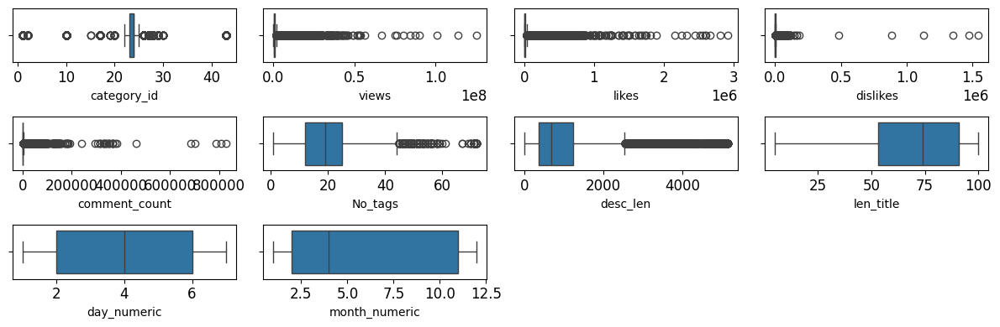

In [ ]:
for i in range(0, len(num)):
    plt.subplot(3, 4, i+1)
    sns.boxplot(x=df[num[i]])
    plt.tight_layout()

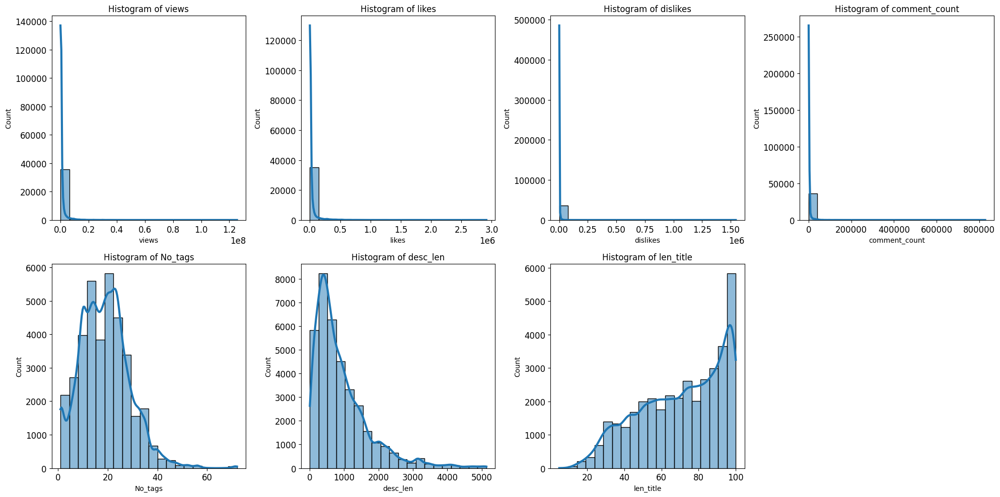

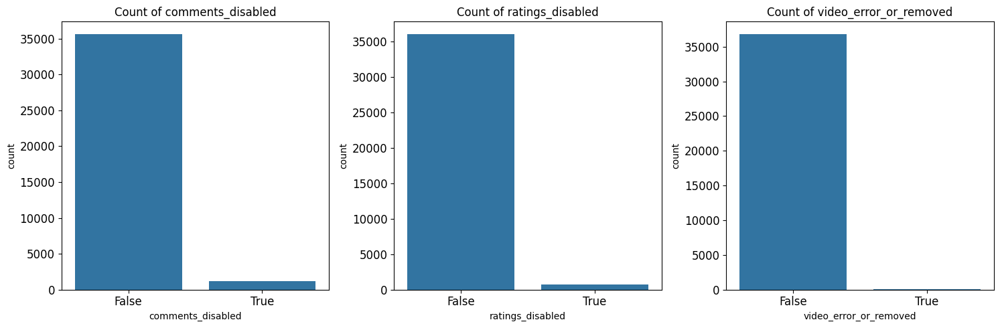

In [ ]:
# Histogram untuk kolom numerik
plt.figure(figsize=(20, 10))
for i, col in enumerate(num, 1):
    plt.subplot(2, 4, i)
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Histogram of {col}')

plt.tight_layout()
plt.show()

# Count plot untuk kolom kategorikal
plt.figure(figsize=(20, 5))
for i, col in enumerate(cat, 1):
    plt.subplot(1, 4, i)
    sns.countplot(x=col, data=df)
    plt.title(f'Count of {col}')

plt.tight_layout()
plt.show()

- Views vs Likes Correlation

In [ ]:
px.scatter(df, x = "views", y = "likes", trendline = "ols", trendline_color_override = "red")


In [ ]:
px.scatter(df, x="views", y="comment_count", trendline="ols", trendline_color_override="red")

In [ ]:
px.scatter(df, x="views", y="desc_len", trendline="ols", trendline_color_override="red",
                 title="Relationship between Views and Description Length")

In [ ]:
px.bar(df.groupby("category_id")["views"].mean().reset_index(), x="category_id", y="views",
       title="Relationship between Views and ID")

In [ ]:
df["dayofweek"] = df["publish_date"].dt.dayofweek + 1
df["month"] = df["publish_date"].dt.month

#Average Viesw per day and month
avg_views_dayofweek = df.groupby("dayofweek")["views"].mean().reset_index(name='avg_views_dayofweek')
avg_likes_dayofweek = df.groupby("dayofweek")["likes"].mean().reset_index(name='avg_likes_dayofweek')
avg_views_month = df.groupby("month")["views"].mean().reset_index(name='avg_views_month')

# Plot
fig1 = px.line(avg_views_dayofweek, x="dayofweek", y="avg_views_dayofweek", title="Average Views per Day of Week")
fig1.update_xaxes(title_text='Day of Week (1=Monday, 7=Sunday)')
fig2 = px.line(avg_views_month, x="month", y="avg_views_month", title="Average Views per Month")
fig3 = px.line(avg_likes_dayofweek, x="dayofweek", y="avg_likes_dayofweek", title="Average likes per Day of Week")

fig1.show()
fig2.show()
fig3.show()


In [ ]:
# Mengekstrak informasi bulan dari kolom 'publish_date' dan menyimpannya dalam kolom baru 'month_numeric'
df["month_numeric"] = df["publish_date"].dt.month
# Mengekstrak informasi hari dari kolom 'publish_date' dan menyimpannya dalam kolom baru 'day_numeric'
df["day_numeric"] = df["publish_date"].dt.dayofweek + 1  # Monday = 0, Sunday = 6, kita tambah 1 agar Monday menjadi 1

In [ ]:
num = ['category_id', 'views', 'likes', 'dislikes', 'comment_count', 'No_tags', 'desc_len', 'len_title', 'day_numeric', 'month_numeric']
cat = ['comments_disabled', 'ratings_disabled', 'video_error_or_removed']

Dari EDA yang telah dilakukan dapat dilihat bahwa:
- Pada descriptive statistic terlihat bahwa `views` memiliki std yang lebih kecil dari mean sehingga cukup baik untuk dimodelkan
- Terdapat korelasi antara positif `views` dengan `likes`, `comment_count`, dan `dislikes`
- Terdapat indikasi kenaikan `views` pada hari tertentu pada hari ke-3, juga bulan tertentu yaitu bulan ke-4 dan bulan ke-6, sehingga fitur `publish_date` sangat berpengaruh
- `category_id` memiliki indikasi dominan view pada kategori no 20, sehingga perlu dipertimbangkan kembali untuk memanfaatkan fitur ini  

### e. _Multivariate Analysis_

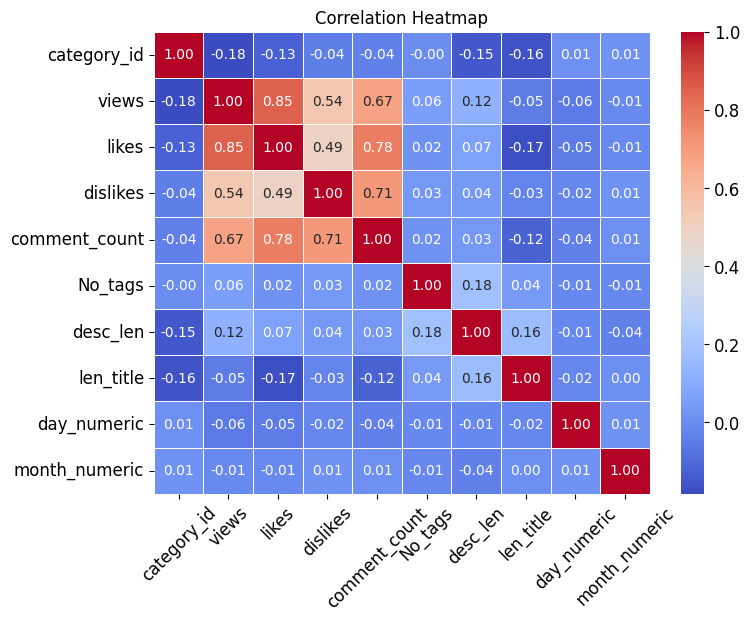

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(df[num].corr(), cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


### f. _Pre-processing_

- Drop categorical data for pre-processing

In [ ]:
# Mengekstrak informasi bulan dan hari dari kolom 'publish_date' dan menyimpannya dalam kolom baru
df["month_numeric"] = df["publish_date"].dt.month
df["day_numeric"] = df["publish_date"].dt.dayofweek + 1  # Monday = 0, Sunday = 6, kita tambah 1 agar Monday menjadi 1


In [ ]:
columns_to_keep = ['likes', 'dislikes', 'comment_count', 'day_numeric', 'month_numeric', 'views']
tr = df[columns_to_keep].copy()
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36791 entries, 0 to 36790
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   likes          36791 non-null  int64
 1   dislikes       36791 non-null  int64
 2   comment_count  36791 non-null  int64
 3   day_numeric    36791 non-null  int32
 4   month_numeric  36791 non-null  int32
 5   views          36791 non-null  int64
dtypes: int32(2), int64(4)
memory usage: 1.4 MB


- Bobot hari akan direpresentasi berdasarkan penyumbangannya terhadap average views, sehingga kategori hari dengan average views terbanyak akan diubah nilainya menjadi nilai maksimalnya yaitu 7 dan begitu juga sebaliknya

In [ ]:
average_views_per_day = tr.groupby('day_numeric')['views'].mean().sort_values(ascending=False)
average_views_per_month = tr.groupby('month_numeric')['views'].mean().sort_values(ascending=False)

print("Day Numeric:")
print(average_views_per_day)
print("\nMonth Numeric:")
print(average_views_per_month)


Day Numeric:
day_numeric
3    1.387376e+06
2    1.253600e+06
1    1.203256e+06
4    1.084220e+06
5    9.834706e+05
7    7.947032e+05
6    7.792625e+05
Name: views, dtype: float64

Month Numeric:
month_numeric
4     1.439032e+06
6     1.433710e+06
5     1.192619e+06
3     1.165885e+06
2     9.995327e+05
11    9.205714e+05
12    8.843854e+05
1     7.609038e+05
Name: views, dtype: float64


In [ ]:
# Membuat mapping dari day_numeric dan month_numeric ke weight
day_weight_mapping = average_views_per_day.rank(ascending=False)
month_weight_mapping = average_views_per_month.rank(ascending=False)

# Membuat kolom baru day_weight dan month_weight
tr['day_weight'] = tr['day_numeric'].map(day_weight_mapping)
tr['month_weight'] = tr['month_numeric'].map(month_weight_mapping)

print(tr[['day_numeric', 'day_weight', 'month_numeric', 'month_weight']].head())


   day_numeric  day_weight  month_numeric  month_weight
0            7         6.0             11           6.0
1            1         3.0             11           6.0
2            7         6.0             11           6.0
3            7         6.0             11           6.0
4            1         3.0             11           6.0


In [ ]:
# Drop kolom day_numeric dan month_numeric
tr.drop(['day_numeric', 'month_numeric'], axis=1, inplace=True)
tr.head()


,likes,dislikes,comment_count,views,day_weight,month_weight
0,33966,798,882,1096327,6.0,6.0
1,735,904,0,590101,3.0,6.0
2,2011,243,149,473988,6.0,6.0
3,70353,1624,2684,1242680,6.0,6.0
4,492,293,66,464015,3.0,6.0


- Outliers Handling

In [ ]:
# Z-score
z_scores = stats.zscore(tr[['likes', 'dislikes', 'comment_count', 'day_weight', 'month_weight', 'views']])
threshold = 3
outlier_indices = (np.abs(z_scores) > threshold).any(axis=1)
outliers = tr[outlier_indices]
print(outliers)

         likes  dislikes  comment_count     views  day_weight  month_weight
17      829362     61195         101117  35885754         2.0           6.0
86     1634126     21082          85067  33523622         4.0           6.0
204      77250      1749          73422    719257         2.0           6.0
212     142237      9944          11907  11805080         7.0           6.0
253     853550     62858         102740  37533416         2.0           6.0
...        ...       ...            ...       ...         ...           ...
36631   309752     10303          21731  19472216         6.0           2.0
36741   468472     60025          48740  27696924         3.0           2.0
36743   524135     14650          55735   3854712         1.0           2.0
36747   322915     10068          28008   3315697         3.0           2.0
36752   309752     10303          21731  19472216         6.0           2.0

[905 rows x 6 columns]


- Logaritmic Transformation (dataset `tr_log`)

In [ ]:
tr_log = tr.copy()
tr_log[['likes', 'dislikes', 'comment_count', 'day_weight', 'month_weight', 'views']] = np.log1p(tr_log[['likes', 'dislikes', 'comment_count', 'day_weight', 'month_weight', 'views']])
tr_log.head()


,likes,dislikes,comment_count,views,day_weight,month_weight
0,10.433145,6.683361,6.783325,13.907477,1.945910,1.94591
1,6.601230,6.807935,0.000000,13.288051,1.386294,1.94591
2,7.606885,5.497168,5.010635,13.068939,1.945910,1.94591
3,11.161295,7.393263,7.895436,14.032782,1.945910,1.94591
4,6.200509,5.683580,4.204693,13.047674,1.386294,1.94591


## 2. **_Feature Engineering_**

Lakukan feature engineering, apakah ada _feature_ tambahan lain yang mendukung dan jelaskan mengapa menggunakan _feature_ tersebut.

- Dataset `tr_log` telah dibuat dengan fitur `likes`, `dislikes`, `comment_count`, `day_weight`, `month_weight` dengan target prediction untuk `views`
- Feature engineering telah dilakukan di atas dengan menambahkan fitur `day_weight` dan `month_weight`, walaupun pada correlation heatmap tidak menunjukan adanya keterkaitan yang kuat, namun pada EDA telah diindikasi adanya kenaikan rata-rata `views` pada hari dan bulan tertentu sehingga kita harus melakukan fitur encoding dari kategori hari dan bulan tersebut

In [ ]:
tr_log.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36791 entries, 0 to 36790
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   likes          36791 non-null  float64
 1   dislikes       36791 non-null  float64
 2   comment_count  36791 non-null  float64
 3   views          36791 non-null  float64
 4   day_weight     36791 non-null  float64
 5   month_weight   36791 non-null  float64
dtypes: float64(6)
memory usage: 1.7 MB


In [ ]:
# Likes per Day
tr_log['likes_per_day'] = tr_log['likes'] / tr_log['day_weight']

# Dislikes per Day
tr_log['dislikes_per_day'] = tr_log['dislikes'] / tr_log['day_weight']

# Comments per Day
tr_log['comments_per_day'] = tr_log['comment_count'] / tr_log['day_weight']

# Interaction per Day
tr_log['interaction_per_day'] = (tr_log['likes'] + tr_log['dislikes'] + tr_log['comment_count']) / tr_log['day_weight']

tr_log.head()


,likes,dislikes,comment_count,views,day_weight,month_weight,likes_per_day,dislikes_per_day,comments_per_day,interaction_per_day
0,10.433145,6.683361,6.783325,13.907477,1.945910,1.94591,5.361576,3.434568,3.485940,12.282083
1,6.601230,6.807935,0.000000,13.288051,1.386294,1.94591,4.761781,4.910887,0.000000,9.672668
2,7.606885,5.497168,5.010635,13.068939,1.945910,1.94591,3.909165,2.824986,2.574957,9.309108
3,11.161295,7.393263,7.895436,14.032782,1.945910,1.94591,5.735771,3.799386,4.057451,13.592608
4,6.200509,5.683580,4.204693,13.047674,1.386294,1.94591,4.472722,4.099836,3.033045,11.605603


Dari featue engineering tersebut telah ditambahkan fitur sebagai berikut:
- `day_weight`, `month_weight`, `likes_per_day`	`dislikes_per_day`, `comments_per_day`, `interaction_per_day`

In [ ]:
tr_log.isna().sum()

likes                  0
dislikes               0
comment_count          0
views                  0
day_weight             0
month_weight           0
likes_per_day          0
dislikes_per_day       0
comments_per_day       0
interaction_per_day    0
dtype: int64

## 3. **_Training Model_ dan Prediksi _Views_**

## Define Plot Untuk Feature Importance

In [ ]:
def plot_feature_importances(model, X_train, model_name):
    import pandas as pd
    import matplotlib.pyplot as plt

    # DataFrame dengan tingkat kepentingan fitur
    feature_importances = pd.DataFrame({
        'feature': X_train.columns,
        'importance': model.feature_importances_
    })

    # Reset index DataFrame
    feature_importances = feature_importances.reset_index(drop=True)

    # Group by
    fi = feature_importances.groupby('feature')['importance'].mean().sort_values(ascending=False)[:20][::-1]

    # Plot
    plt.figure(figsize=(12, 6))
    fi.plot(kind='barh')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title(f'Top Feature Importances - {model_name}')
    plt.show()

# Contoh pemanggilan
# plot_feature_importances(best_model_xgb, X_train, 'XGBRegressor')


## Train Linear Regression

In [ ]:
X = tr_log.drop(columns=['views'])
y = tr_log[['views']]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
# Train linear regression
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred_lr = regressor.predict(X_test)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25753 entries, 23009 to 15795
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   likes                25753 non-null  float64
 1   dislikes             25753 non-null  float64
 2   comment_count        25753 non-null  float64
 3   day_weight           25753 non-null  float64
 4   month_weight         25753 non-null  float64
 5   likes_per_day        25753 non-null  float64
 6   dislikes_per_day     25753 non-null  float64
 7   comments_per_day     25753 non-null  float64
 8   interaction_per_day  25753 non-null  float64
dtypes: float64(9)
memory usage: 2.0 MB


In [ ]:
print(regressor.intercept_)

[9.53002257]


### Linear Regression Coefficient

In [ ]:
regressor.coef_

array([[ 0.00550004,  0.60727954,  0.02321938, -0.17763236, -0.10003726,
        -0.07734161, -0.03126635,  0.11206583,  0.00345788]])

### Check overfit / underfit

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import cross_validate

def eval_regression(model):
  y_pred = model.predict(X_test)
  y_pred_train = model.predict(X_train)

  print('RMSE (test): ' + str(mean_squared_error(y_test, y_pred, squared=False)))
  print('RMSE (train): ' + str(mean_squared_error(y_train, y_pred_train, squared=False)))

  print('MAPE (test): ' + str(mean_absolute_percentage_error(y_test, y_pred)))
  print('MAPE (train): ' + str(mean_absolute_percentage_error(y_train, y_pred_train)))

  print('r2 (test): ' + str(r2_score(y_test, y_pred)))
  print('r2 (train): ' + str(r2_score(y_train, y_pred_train)))

  # k-fold cross validation
  score = cross_validate(model, X, y, cv=5, scoring='r2', return_train_score=True)
  print('r2 (cross-val test): ' + str(score['test_score'].mean()))
  print('r2 (cross-val train): ' + str(score['train_score'].mean()))

eval_regression(regressor)

RMSE (test): 0.8098662817386345
RMSE (train): 0.8077821073519007
MAPE (test): 0.04769599050545127
MAPE (train): 0.048111836377279185
r2 (test): 0.6656190666179143
r2 (train): 0.6728580721600167
r2 (cross-val test): 0.6523239372358274
r2 (cross-val train): 0.670440761433448


R2 antara data train dan test tidak jauh. model tidak overfit

## Regularization: Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(X_train, y_train)
eval_regression(ridge)

RMSE (test): 0.8098639975375317
RMSE (train): 0.807782111733887
MAPE (test): 0.04769600528515809
MAPE (train): 0.04811191142460927
r2 (test): 0.6656209528360144
r2 (train): 0.6728580686107144
r2 (cross-val test): 0.6523548741232376
r2 (cross-val train): 0.6704477678843013


*Performanya tidak bertambah karena model awal tidak overfitting*

---



### Hyperparameter Tuning - Ridge

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

alpha = [0.001, 0.01]
solver = ['auto', 'cholesky', 'lsqr']
hyperparameters = dict(alpha=alpha, solver=solver)

from sklearn.linear_model import Ridge
ridge = Ridge()
rs = RandomizedSearchCV(ridge, hyperparameters, scoring='r2', cv=5, random_state=42)
rs.fit(X_train, y_train)
eval_regression(rs)

RMSE (test): 0.809916670810425
RMSE (train): 0.8077841975436182
MAPE (test): 0.04769753669100914
MAPE (train): 0.04811298735576079
r2 (test): 0.6655774556275422
r2 (train): 0.6728563791533841
r2 (cross-val test): 0.6523282619506224
r2 (cross-val train): 0.6704463282080708


## Regularization - Lasso

In [ ]:
from sklearn.linear_model import Lasso
lasso_model = Lasso()
lasso_model.fit(X_train, y_train)
eval_regression(lasso_model)

RMSE (test): 1.000951856180734
RMSE (train): 1.0135696811946513
MAPE (test): 0.06254076341805034
MAPE (train): 0.06350679535102242
r2 (test): 0.4892113379137665
r2 (train): 0.4849433812865934
r2 (cross-val test): 0.4498019014895006
r2 (cross-val train): 0.48103888391659455


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

alpha = [0.02, 0.024, 0.025, 0.026, 0.03] # alpha or lambda
selection = ['cyclic', 'random']
hyperparameters = dict(alpha=alpha)

from sklearn.linear_model import Lasso
lasso_model = Lasso()
ls = RandomizedSearchCV(lasso_model, hyperparameters, cv=5, random_state=42, scoring='r2')

#Fitting Model
ls.fit(X_train, y_train)
eval_regression(ls)

RMSE (test): 0.8117716465055862
RMSE (train): 0.811122542657802
MAPE (test): 0.047660964842871426
MAPE (train): 0.04809759351816783
r2 (test): 0.6640438260283663
r2 (train): 0.6701468064217861
r2 (cross-val test): 0.649857454919917
r2 (cross-val train): 0.6677648858419157


## Regularization - Elastic Net

In [ ]:
from sklearn.linear_model import ElasticNet
elasticnet_model = ElasticNet()
elasticnet_model.fit(X_train, y_train)
eval_regression(elasticnet_model)

RMSE (test): 0.8924050755665907
RMSE (train): 0.9015021336903889
MAPE (test): 0.055001567761425965
MAPE (train): 0.05585575472038717
r2 (test): 0.5939879403086061
r2 (train): 0.5925434832272098
r2 (cross-val test): 0.5669307509465895
r2 (cross-val train): 0.5900966744039852


## XGBRegressor

In [ ]:
from xgboost import XGBRegressor
xgb = xgb = XGBRegressor()
xgb.fit(X_train, y_train)
eval_regression(xgb)

RMSE (test): 0.5725901856402758
RMSE (train): 0.4664867905954546
MAPE (test): 0.034995070923113075
MAPE (train): 0.02845324641031197
r2 (test): 0.8328514283174872
r2 (train): 0.8908995727930407
r2 (cross-val test): 0.760859016210466
r2 (cross-val train): 0.8894901206941652


### Hypertuning - warning ! Run in appropriate device

In [ ]:
from xgboost import XGBRegressor

# Menentukan hiperparameter yang akan diuji
n_estimators = [500, 1000]
max_depth = [6]
learning_rate = [0.05]
colsample_bytree = [0.5]
random_state = 1452

best_score = float('inf')
best_params = {}

for est in n_estimators:
    for depth in max_depth:
        for lr in learning_rate:
            for colsample in colsample_bytree:
                # Membuat model XGBRegressor
                xgb = XGBRegressor(n_estimators=est, max_depth=depth, learning_rate=lr, colsample_bytree=colsample, random_state=random_state)

                # Melatih model dan menghitung RMSE
                xgb.fit(X_train, y_train)
                rmse = np.sqrt(mean_squared_error(y_test, xgb.predict(X_test)))

                # Memeriksa apakah hasil lebih baik dari yang sebelumnya
                if rmse < best_score:
                    best_score = rmse
                    best_params = {
                        'n_estimators': est,
                        'max_depth': depth,
                        'learning_rate': lr,
                        'colsample_bytree': colsample
                    }

# Menampilkan hasil terbaik
print("Best parameters:", best_params)
print("Best RMSE score:", best_score)

# Membuat model XGBRegressor dengan parameter terbaik
best_model_xgb = XGBRegressor(**best_params, random_state=random_state)
best_model_xgb.fit(X_train, y_train)
y_pred_xgb = best_model_xgb.predict(X_test)
eval_regression(best_model_xgb)


Best parameters: {'n_estimators': 1000, 'max_depth': 6, 'learning_rate': 0.05, 'colsample_bytree': 0.5}
Best RMSE score: 0.562772895616425
RMSE (test): 0.562772895616425
RMSE (train): 0.440188316791439
MAPE (test): 0.03441395687474392
MAPE (train): 0.026827788898523608
r2 (test): 0.8385339520666841
r2 (train): 0.9028540334825885
r2 (cross-val test): 0.7805127281734601
r2 (cross-val train): 0.9009719851482103


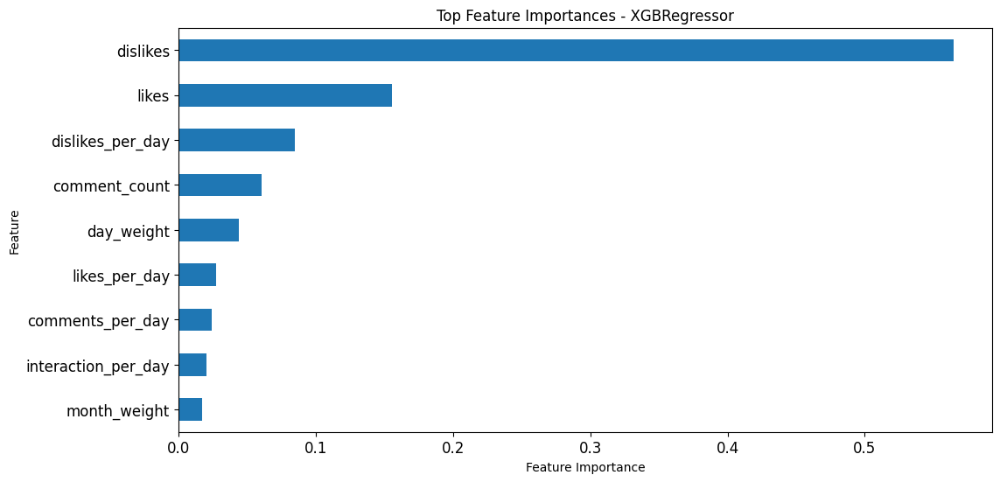

In [ ]:
plot_feature_importances(xgb, X_train, 'XGBRegressor')

## LGBMRegressor

In [ ]:
import lightgbm as lgb
lgb = lgb.LGBMRegressor(verbose=-1)
lgb.fit(X_train, y_train)
eval_regression(lgb)

RMSE (test): 0.5802276006064744
RMSE (train): 0.5505455613439533
MAPE (test): 0.0358779660100268
MAPE (train): 0.03423357323299301
r2 (test): 0.8283627144063795
r2 (train): 0.8480382516829861
r2 (cross-val test): 0.7976952116513575
r2 (cross-val train): 0.8495004410435014


### Hypertuning

In [ ]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
import numpy as np

# Menentukan hiperparameter yang akan diuji
n_estimators = [500, 1000]
max_depth = [6]
learning_rate = [0.05]
colsample_bytree = [0.5]
random_state = 1452

best_score = float('inf')
best_params = {}

for est in n_estimators:
    for depth in max_depth:
        for lr in learning_rate:
            for colsample in colsample_bytree:
                # Membuat model LGBMRegressor
                lgbm = lgb.LGBMRegressor(n_estimators=est, max_depth=depth, learning_rate=lr, colsample_bytree=colsample, random_state=random_state, verbose=-1)

                # Melatih model dan menghitung RMSE
                lgbm.fit(X_train, y_train)
                rmse = np.sqrt(mean_squared_error(y_test, lgbm.predict(X_test)))

                # Memeriksa apakah hasil lebih baik dari yang sebelumnya
                if rmse < best_score:
                    best_score = rmse
                    best_params = {
                        'n_estimators': est,
                        'max_depth': depth,
                        'learning_rate': lr,
                        'colsample_bytree': colsample
                    }

# Menampilkan hasil terbaik
print("Best parameters:", best_params)
print("Best RMSE score:", best_score)

# Membuat model LGBMRegressor dengan parameter terbaik
best_model_lgbm = lgb.LGBMRegressor(**best_params, random_state=random_state, verbose=-1)
best_model_lgbm.fit(X_train, y_train)
y_pred_lgbm = best_model_lgbm.predict(X_test)
eval_regression(best_model_lgbm)


Best parameters: {'n_estimators': 1000, 'max_depth': 6, 'learning_rate': 0.05, 'colsample_bytree': 0.5}
Best RMSE score: 0.5657272252935572
RMSE (test): 0.5657272252935572
RMSE (train): 0.4851912630269828
MAPE (test): 0.034744390608095116
MAPE (train): 0.029866205137628478
r2 (test): 0.8368342396882847
r2 (train): 0.8819750856583961
r2 (cross-val test): 0.7888508858427612
r2 (cross-val train): 0.8831366374748395


## Non Linear Algorithm

## Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(X_train, y_train)
eval_regression(dt)

RMSE (test): 0.7418177691669656
RMSE (train): 0.09892975721417954
MAPE (test): 0.04073134185802026
MAPE (train): 0.0006447454370639392
r2 (test): 0.7194506064815098
r2 (train): 0.9950931629387575
r2 (cross-val test): 0.6072612605405785
r2 (cross-val train): 0.9948082768063624


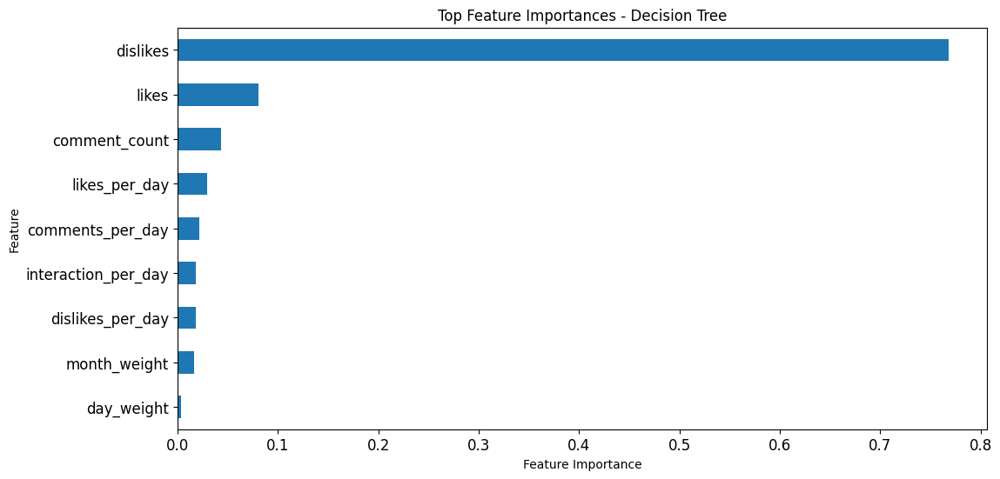

In [ ]:
plot_feature_importances(dt, X_train, 'Decision Tree')

### Hypertuning

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor

# Menentukan rentang hiperparameter yang akan diuji
param_grid = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Membuat model DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=42)

# Melakukan Randomized Search CV
dt = RandomizedSearchCV(dt, param_distributions=param_grid, scoring='neg_mean_squared_error', cv=5, n_iter=50, random_state=42)
dt.fit(X_train, y_train)

# Menampilkan hasil terbaik
print("Best parameters:", dt.best_params_)
print("Best RMSE score:", np.sqrt(-dt.best_score_))

# DecisionTreeRegressor dengan model terbaik
best_model_dt = dt.best_estimator_
best_model_dt.fit(X_train, y_train)
y_pred_dt = best_model_dt.predict(X_test)
eval_regression(best_model_dt)


## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
eval_regression(rf)

RMSE (test): 0.5413074480068285
RMSE (train): 0.22130680933769636
MAPE (test): 0.03198536515271051
MAPE (train): 0.012263532199757182
r2 (test): 0.8506164157175794
r2 (train): 0.9754451489536342
r2 (cross-val test): 0.7853150220240427
r2 (cross-val train): 0.9770214451914285


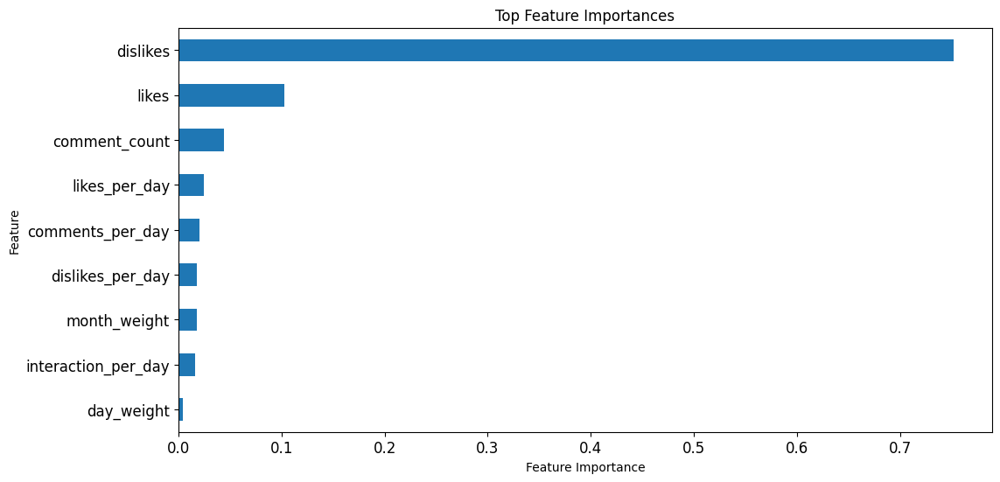

In [ ]:
plot_feature_importances(rf, X_train)

### Hypertuning

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Menentukan rentang hiperparameter yang akan diuji
param_grid = {
    'n_estimators': [100, 500, 1000],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

rf = RandomForestRegressor(random_state=42)

# Melakukan Randomized Search CV
rf = RandomizedSearchCV(RF, param_distributions=param_grid, scoring='neg_mean_squared_error', cv=5, n_iter=50, random_state=42)
rf.fit(X_train, y_train)

# Menampilkan hasil terbaik
print("Best parameters:", rf.best_params_)
print("Best RMSE score:", np.sqrt(-rf.best_score_))

# Evaluasi model terbaik
best_model_rf = rf.best_estimator_
best_model_rf.fit(X_train, y_train)
y_pred_rf = best_model_rf.predict(X_test)
eval_regression(rf)


## Support Vector Regressor

In [ ]:
from sklearn.svm import SVR
svr = SVR()
svr.fit(X_train, y_train)
eval_regression(svr)

RMSE (test): 0.6234238612279143
RMSE (train): 0.6256297390557044
MAPE (test): 0.03842418711321595
MAPE (train): 0.03875136736135758
r2 (test): 0.801855641622001
r2 (train): 0.8037622664185805
r2 (cross-val test): 0.7894484375531953
r2 (cross-val train): 0.8037984763581877


## K-Nearest Neighbors

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)
eval_regression(knn)

RMSE (test): 0.5932458688691133
RMSE (train): 0.4773564361675209
MAPE (test): 0.03590158118252414
MAPE (train): 0.028617669341143463
r2 (test): 0.8205744378952011
r2 (train): 0.8857560224239812
r2 (cross-val test): 0.7495693969378948
r2 (cross-val train): 0.8928896671001436


## 4. **_Model Evaluating_**

Evaluasi model dengan metrics RMSE dan R<sup>2</sup><br>
Jelaskan dan berikan analisis mengapa memilih model tersebut sebagai model akhir yang digunakan.

### a. Visual Tiap Metode

#### Linear Algorithm

In [ ]:
y_pred = regressor.predict(X_test)
y_pred_dt = dt.predict(X_test)
y_pred_ridge = ridge.predict(X_test)
y_pred_rf = rf.predict(X_test)
y_pred_svr = svr.predict(X_test)
y_pred_knn = knn.predict(X_test)
y_pred_lasso = ls.predict(X_test)
y_pred_elasticnet = elasticnet_model.predict(X_test)
y_pred_lgbm = best_model_lgbm.predict(X_test)
y_pred_xgb = best_model_xgb.predict(X_test)



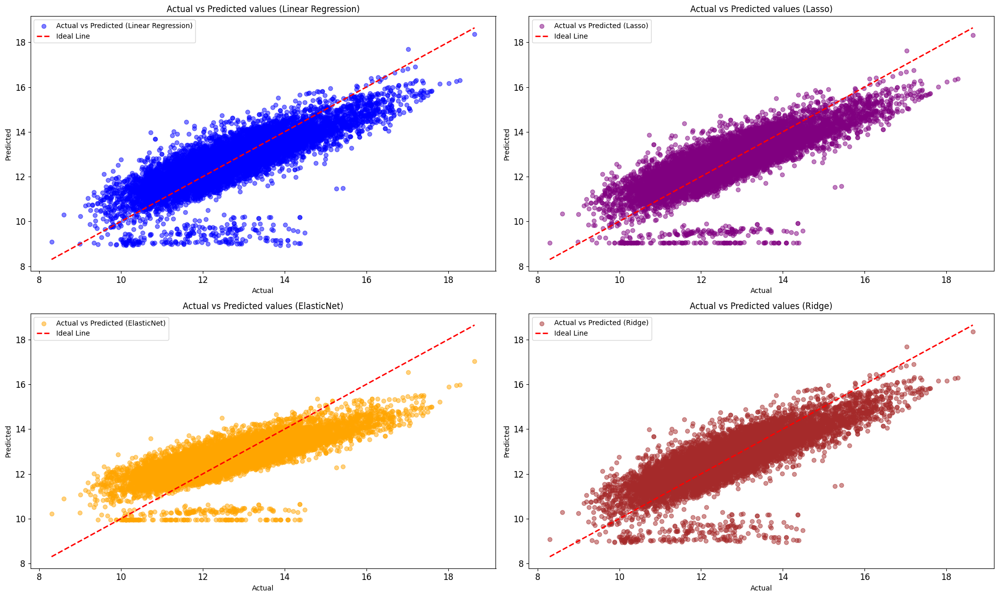

In [ ]:
# Plotting
plt.figure(figsize=(20, 12))

# Linear Regression
plt.subplot(221)
plt.scatter(y_test, y_pred, color='blue', label='Actual vs Predicted (Linear Regression)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (Linear Regression)')
plt.legend()

# Lasso
plt.subplot(222)
plt.scatter(y_test, y_pred_lasso, color='purple', label='Actual vs Predicted (Lasso)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (Lasso)')
plt.legend()

# ElasticNet
plt.subplot(223)
plt.scatter(y_test, y_pred_elasticnet, color='orange', label='Actual vs Predicted (ElasticNet)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (ElasticNet)')
plt.legend()

# Ridge
plt.subplot(224)
plt.scatter(y_test, y_pred_ridge, color='brown', label='Actual vs Predicted (Ridge)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (Ridge)')
plt.legend()

plt.tight_layout()
plt.show()


#### Non Linear Algorithm

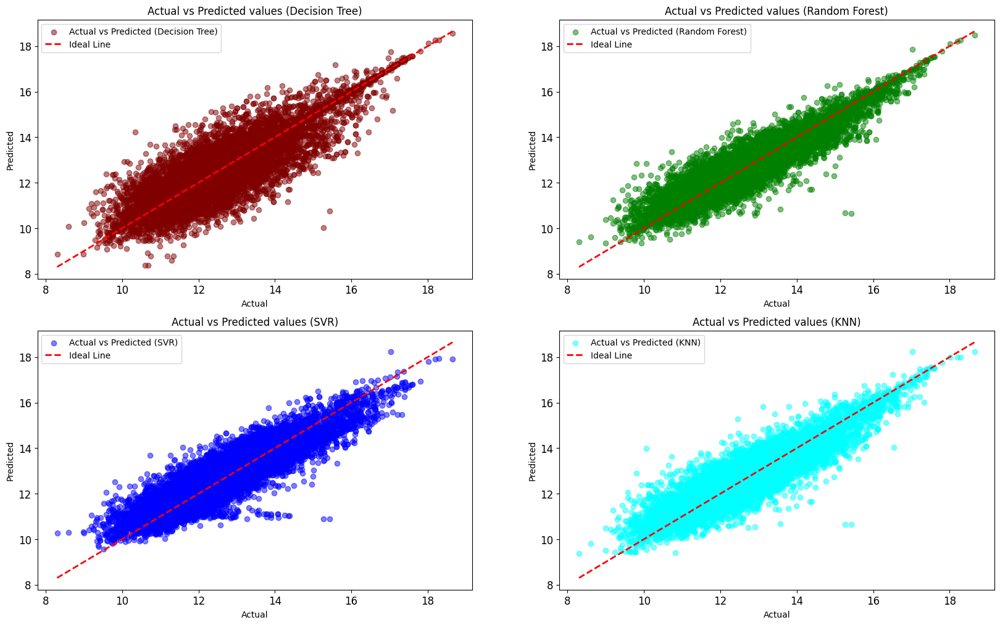

In [ ]:
# Plotting
plt.figure(figsize=(20, 12))

# Decision Tree
plt.subplot(221)
plt.scatter(y_test, y_pred_dt, color='maroon', label='Actual vs Predicted (Decision Tree)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (Decision Tree)')
plt.legend()

# Random Forest
plt.subplot(222)
plt.scatter(y_test, y_pred_rf, color='green', label='Actual vs Predicted (Random Forest)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (Random Forest)')
plt.legend()

# SVR
plt.subplot(223)
plt.scatter(y_test, y_pred_svr, color='blue', label='Actual vs Predicted (SVR)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (SVR)')
plt.legend()

# KNN
plt.subplot(224)
plt.scatter(y_test, y_pred_knn, color='cyan', label='Actual vs Predicted (KNN)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (KNN)')
plt.legend()



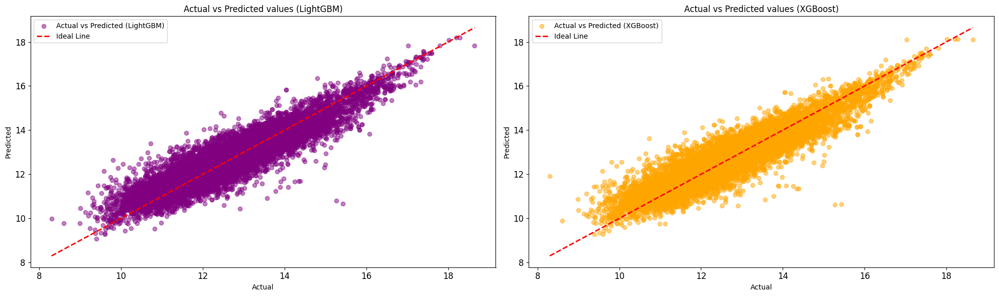

In [ ]:
import matplotlib.pyplot as plt

# Plotting
plt.figure(figsize=(20, 6))

# LightGBM
plt.subplot(121)
plt.scatter(y_test, y_pred_lgbm, color='purple', label='Actual vs Predicted (LightGBM)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (LightGBM)')
plt.legend()

# XGBoost
plt.subplot(122)
plt.scatter(y_test, y_pred_xgb, color='orange', label='Actual vs Predicted (XGBoost)', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red', label='Ideal Line')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values (XGBoost)')
plt.legend()

plt.tight_layout()
plt.show()


### b. RMSE dan MSE

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Menggunakan model Linear Regression
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)
print("Root Mean Squared Error (Linear Regression):", rmse_lr)
print("R-squared (Linear Regression):", r2_lr)

# Menggunakan model Decision Tree Regressor
rmse_dt = mean_squared_error(y_test, y_pred_dt, squared=False)
r2_dt = r2_score(y_test, y_pred_dt)
print("Root Mean Squared Error (Decision Tree):", rmse_dt)
print("R-squared (Decision Tree):", r2_dt)

# Menggunakan model Random Forest Regressor
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)
print("Root Mean Squared Error (Random Forest):", rmse_rf)
print("R-squared (Random Forest):", r2_rf)

# Menggunakan model SVR
rmse_svr = mean_squared_error(y_test, y_pred_svr, squared=False)
r2_svr = r2_score(y_test, y_pred_svr)
print("Root Mean Squared Error (SVR):", rmse_svr)
print("R-squared (SVR):", r2_svr)

# Menggunakan model Lasso
rmse_lasso = mean_squared_error(y_test, y_pred_lasso, squared=False)
r2_lasso = r2_score(y_test, y_pred_lasso)
print("Root Mean Squared Error (Lasso):", rmse_lasso)
print("R-squared (Lasso):", r2_lasso)

# Menggunakan model ElasticNet
rmse_elasticnet = mean_squared_error(y_test, y_pred_elasticnet, squared=False)
r2_elasticnet = r2_score(y_test, y_pred_elasticnet)
print("Root Mean Squared Error (ElasticNet):", rmse_elasticnet)
print("R-squared (ElasticNet):", r2_elasticnet)

# Menggunakan model LightGBM
rmse_lgbm = mean_squared_error(y_test, y_pred_lgbm, squared=False)
r2_lgbm = r2_score(y_test, y_pred_lgbm)
print("Root Mean Squared Error (LightGBM):", rmse_lgbm)
print("R-squared (LightGBM):", r2_lgbm)

# Menggunakan model XGBoost
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)
r2_xgb = r2_score(y_test, y_pred_xgb)
print("Root Mean Squared Error (XGBoost):", rmse_xgb)
print("R-squared (XGBoost):", r2_xgb)


Root Mean Squared Error (Linear Regression): 0.8098662817386345
R-squared (Linear Regression): 0.6656190666179143
Root Mean Squared Error (Decision Tree): 0.7418177691669656
R-squared (Decision Tree): 0.7194506064815098
Root Mean Squared Error (Random Forest): 0.5413074480068285
R-squared (Random Forest): 0.8506164157175794
Root Mean Squared Error (SVR): 0.6234238612279143
R-squared (SVR): 0.801855641622001
Root Mean Squared Error (Lasso): 0.8117716465055862
R-squared (Lasso): 0.6640438260283663
Root Mean Squared Error (ElasticNet): 0.8924050755665907
R-squared (ElasticNet): 0.5939879403086061
Root Mean Squared Error (LightGBM): 0.5657272252935572
R-squared (LightGBM): 0.8368342396882847
Root Mean Squared Error (XGBoost): 0.562772895616425
R-squared (XGBoost): 0.8385339520666841


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

results = {}

# RMSE dan R-squared untuk setiap model
models = {
    "Linear Regression": (y_pred_lr, rmse_lr, r2_lr),
    "Lasso": (y_pred_lasso, rmse_lasso, r2_lasso),
    "ElasticNet": (y_pred_elasticnet, rmse_elasticnet, r2_elasticnet),
    "Random Forest": (y_pred_rf, rmse_rf, r2_rf),
    "XGBoost": (y_pred_xgb, rmse_xgb, r2_xgb),
    "LightGBM": (y_pred_lgbm, rmse_lgbm, r2_lgbm),
    "SVR": (y_pred_svr, rmse_svr, r2_svr),
    "Decision Tree": (y_pred_dt, rmse_dt, r2_dt)
}

for model_name, (y_pred, rmse, r2) in models.items():
    results[model_name] = {
        "RMSE": rmse,
        "R-squared": r2
    }

# Sort by RMSE
sorted_results_rmse = sorted(results.items(), key=lambda x: x[1]["RMSE"])

# Sort by R-squared
sorted_results_r2 = sorted(results.items(), key=lambda x: x[1]["R-squared"])

print("Hasil pengurutan berdasarkan RMSE:")
for i, (model_name, result) in enumerate(sorted_results_rmse, start=1):
    print(f"{i}. {model_name}: RMSE = {result['RMSE']}, R-squared = {result['R-squared']}")

print("\nHasil pengurutan berdasarkan R-squared:")
for i, (model_name, result) in enumerate(sorted_results_r2, start=1):
    print(f"{i}. {model_name}: RMSE = {result['RMSE']}, R-squared = {result['R-squared']}")


Hasil pengurutan berdasarkan RMSE:
1. Random Forest: RMSE = 0.5413074480068285, R-squared = 0.8506164157175794
2. XGBoost: RMSE = 0.562772895616425, R-squared = 0.8385339520666841
3. LightGBM: RMSE = 0.5657272252935572, R-squared = 0.8368342396882847
4. SVR: RMSE = 0.6234238612279143, R-squared = 0.801855641622001
5. Decision Tree: RMSE = 0.7418177691669656, R-squared = 0.7194506064815098
6. Linear Regression: RMSE = 0.8098662817386345, R-squared = 0.6656190666179143
7. Lasso: RMSE = 0.8117716465055862, R-squared = 0.6640438260283663
8. ElasticNet: RMSE = 0.8924050755665907, R-squared = 0.5939879403086061

Hasil pengurutan berdasarkan R-squared:
1. ElasticNet: RMSE = 0.8924050755665907, R-squared = 0.5939879403086061
2. Lasso: RMSE = 0.8117716465055862, R-squared = 0.6640438260283663
3. Linear Regression: RMSE = 0.8098662817386345, R-squared = 0.6656190666179143
4. Decision Tree: RMSE = 0.7418177691669656, R-squared = 0.7194506064815098
5. SVR: RMSE = 0.6234238612279143, R-squared = 0.

- `Random forest` menghasilkan nilai RMSE `0.5413074480068285` dimana nilai error ini yang paling kecil dari RMSE metode lain
- Dengan urutan kemampuan metode sebagai berikut :

Hasil pengurutan berdasarkan RMSE:
1. Random Forest: RMSE = 0.5413074480068285, R-squared = 0.8506164157175794
2. XGBoost: RMSE = 0.562772895616425, R-squared = 0.8385339520666841
3. LightGBM: RMSE = 0.5657272252935572, R-squared = 0.8368342396882847
4. SVR: RMSE = 0.6234238612279143, R-squared = 0.801855641622001
5. Decision Tree: RMSE = 0.7418177691669656, R-squared = 0.7194506064815098
6. Linear Regression: RMSE = 0.8098662817386345, R-squared = 0.6656190666179143
7. Lasso: RMSE = 0.8117716465055862, R-squared = 0.6640438260283663
8. ElasticNet: RMSE = 0.8924050755665907, R-squared = 0.5939879403086061

Hasil pengurutan berdasarkan R-squared:
1. ElasticNet: RMSE = 0.8924050755665907, R-squared = 0.5939879403086061
2. Lasso: RMSE = 0.8117716465055862, R-squared = 0.6640438260283663
3. Linear Regression: RMSE = 0.8098662817386345, R-squared = 0.6656190666179143
4. Decision Tree: RMSE = 0.7418177691669656, R-squared = 0.7194506064815098
5. SVR: RMSE = 0.6234238612279143, R-squared = 0.801855641622001
6. LightGBM: RMSE = 0.5657272252935572, R-squared = 0.8368342396882847
7. XGBoost: RMSE = 0.562772895616425, R-squared = 0.8385339520666841
8. Random Forest: RMSE = 0.5413074480068285, R-squared = 0.8506164157175794

- Karena RMSE menghitung rentang error dari nilai y_test (actual) dan y_predict (predicted). Maka nilai RMSE yang paling kecil merupakan pilihan terbaik dikarenakan nilai predicted berpotensi menyamai nilai actual